# June 1, 2022: PyTorch models
create and train RNN model properly on the MAX dataset.

In [1]:
import os
import sys
from os.path import join as pjoin

import numpy as np
import pandas as pd
import scipy as sp

import torch
import torch.nn as nn 
import torch.nn.functional as F
print(torch.cuda.is_available())

import pickle, time, random
# import neural_structured_learning as nsl
from tqdm import tqdm
import json
from itertools import combinations, product
from operator import add
import copy
from glob import glob
from sklearn import metrics

# explanation tools
import captum

# plotting
import matplotlib as mpl
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
plt.rcParamsDefault['font.family'] = "sans-serif"
plt.rcParamsDefault['font.sans-serif'] = "Arial"
plt.rcParams['font.size'] = 14
plt.rcParams["errorbar.capsize"] = 0.5

# nilearn
from nilearn import image
from nilearn import masking
from nilearn import plotting

# main dirs
proj_dir = pjoin(os.environ['HOME'], 'explainable-ai')
results_dir = f"{proj_dir}/results"
month_dir = f"{proj_dir}/nb/jun22"

# folders
sys.path.insert(0, proj_dir)
import helpers.dataset_utils as dataset_utils
import helpers.base_model as base_model
import helpers.model_definitions as model_definitions

True


2022-06-03 13:15:13.566433: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
device = "cuda:1" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

Using cuda:1 device


## dataset

In [3]:
def plot_roi_time_series(X, y, fig_file=None, savefig=True):
    X_conds = {}
    for label in args.LABELS:
        idx = y[:, 0] == label
        X_conds[f"{label}_m"] = np.mean(X[idx, :], axis=0)
        X_conds[f"{label}_s"] = 1.96 * np.std(X[idx, :], axis=0) / np.sqrt(idx.shape[0])

    roi_name_file = (
        f"{os.environ['HOME']}/parcellations/MAX_85_ROI_masks/ROI_names.txt"
    )
    roi_names = pd.read_csv(roi_name_file, names=['roi_name']).values.squeeze()

    time = np.arange(X.shape[1])
    names = ['safe', 'threat']
    colors = {0:'royalblue', 1:'firebrick'}
    nrows, ncols = 17, 5

    fig, axs = plt.subplots(
        nrows=nrows, 
        ncols=ncols, 
        figsize=(5*ncols, 4*nrows), 
        sharex=False, 
        sharey=True, 
        dpi=150
    )

    plt.subplots_adjust(
        left=None, bottom=None, 
        right=None, top=None, 
        wspace=None, hspace=0.5
    )

    for idx_roi, roi_name in enumerate(roi_names):
        ax = axs[idx_roi//ncols, np.mod(idx_roi,ncols)]

        ax.set_title(f"{roi_name}")
        for label in args.LABELS:
            ts_mean = X_conds[f"{label}_m"][:, idx_roi]
            ts_std = X_conds[f"{label}_s"][:, idx_roi]

            ax.plot(ts_mean, color=colors[label], label=names[label])

            ax.fill_between(
                time, 
                (ts_mean - ts_std), 
                (ts_mean + ts_std),
                alpha=0.3, color=colors[label],
            )
        ax.set_xlabel(f"time")
        ax.set_ylabel(f"roi resp.")
        ax.grid(True)
        ax.legend()

    if savefig:
        fig.savefig(
            fig_file,
            dpi=150,
            format='png',
            bbox_inches='tight',
            transparent=False
        )

In [4]:
def get_data(data_df, subj_idx_list):
    normalize = lambda z: (z - np.mean(z)) / np.std(z)

    X, y = [], []
    for idx_row in tqdm(subj_idx_list):
        subj, ts, targets = data_df.iloc[idx_row]

        for label in args.LABELS:
            contig_regions = dataset_utils.contiguous_regions(targets == label)

            for region in contig_regions:
                X.append(ts[region[0]: region[1], :])
                y.append(targets[region[0]: region[1]])

    X = np.stack(X, axis=0)
    y = np.stack(y, axis=0)

    for idx_roi in np.arange(X.shape[-1]):
        X[:, :, idx_roi] = normalize(np.squeeze(X[:, :, idx_roi]))
    
    return torch.FloatTensor(X).to(device=device), torch.LongTensor(y).to(device=device)

In [5]:
'''
dataframe
'''
max_data_path = f"{proj_dir}/data/max/data_df.pkl"
with open(max_data_path, 'rb') as f:
    max_data_df = pickle.load(f)

'''
(hyper)-parameters
'''
class ARGS(): pass
args = ARGS()

args.SEED = 74
args.LABELS = [0, 1]
args.names = ['safe', 'threat']
args.MASK = -100

# data
args.num_subjects = len(max_data_df)
args.num_train = round(0.4 * args.num_subjects)
args.num_valid = round(0.3 * args.num_subjects)
args.num_test = args.num_subjects - args.num_train - args.num_valid

'''
generate dataset for the model
'''
subject_idx_list = np.arange(args.num_subjects)
# random.Random(args.SEED).shuffle(subject_idx_list)

train_idx_list = subject_idx_list[:args.num_train]
valid_idx_list = subject_idx_list[args.num_train : args.num_train + args.num_valid]
test_idx_list = subject_idx_list[args.num_train + args.num_valid:]

(X_train, y_train) = get_data(max_data_df, train_idx_list)
(X_valid, y_valid) = get_data(max_data_df, valid_idx_list) 
(X_test, y_test) = get_data(max_data_df, test_idx_list)

100%|██████████| 32/32 [00:00<00:00, 8182.01it/s]


In [6]:
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)
print(X_test.shape, y_test.shape)

torch.Size([1336, 14, 85]) torch.Size([1336, 14])
torch.Size([1016, 14, 85]) torch.Size([1016, 14])
torch.Size([974, 14, 85]) torch.Size([974, 14])


## models

In [7]:
def plot_training_history(history, best_epoch):
    fig, axs = plt.subplots(
        nrows=2, ncols=1,
        figsize=(11,5),
        dpi=150
    )

    ax = axs[0]
    ax.plot(history['train_loss'], color='tomato', linestyle='-.', label='training_loss')
    ax.plot(history['valid_loss'], color='forestgreen', label='valid_loss')
    ax.set_ylabel(f"losses")
    ax.set_xlabel(f"epochs")
    ax.legend()
    ax.grid(True)

    ax = axs[1]
    ax.plot(history['train_acc'], color='tomato', linestyle='-.', label='training_acc')
    ax.plot(history['valid_acc'], color='forestgreen', label='valid_acc')
    ax.axvline(x=best_epoch, ymax=1.0, label='best_epoch')
    ax.set_ylabel(f"accuracies")
    ax.set_xlabel(f"epochs")
    ax.set_ylim(0.5, 1.0)
    ax.legend()
    ax.grid(True)

def plot_confusion_matrix(labels, pred_labels):
    fig = plt.figure(figsize=(3*args.num_classes, 3*args.num_classes))
    ax = fig.add_subplot(1, 1, 1)
    cm = metrics.confusion_matrix(labels, pred_labels)
    cm = metrics.ConfusionMatrixDisplay(cm, display_labels=range(args.num_classes))
    cm.plot(values_format='d', cmap='Blues', ax=ax)

In [8]:
def train(model, X, y, opt, criterion, permutation):
    epoch_losses = []
    epoch_accs = []

    model.train()

    for i in range(0, X.size()[0], args.batch_size):

        opt.zero_grad()

        indices = permutation[i:i + args.batch_size]
        batch_x, batch_y = X[indices], y[indices]

        y_pred = model(batch_x,)
        loss = criterion(
            y_pred.view(-1, args.num_classes), 
            batch_y.view(-1)
        )

        acc = model.accuracy(y_pred, batch_y)

        loss.backward()
        opt.step()

        epoch_losses += [loss.item()]
        epoch_accs += [acc.item()]

    return  np.sum(epoch_losses) / len(epoch_losses), np.sum(epoch_accs) / len(epoch_accs)


def evaluate(model, X, y, criterion, permutation):
    epoch_losses = []
    epoch_accs = []

    model.eval()

    with torch.no_grad():
        for i in range(0, X.size()[0], args.batch_size):
            indices = permutation[i:i + args.batch_size]
            batch_x, batch_y = X[indices], y[indices]

            y_pred = model(batch_x,)
            loss = criterion(
                y_pred.view(-1, args.num_classes), 
                batch_y.view(-1)
            )

            acc = model.accuracy(y_pred, batch_y)

            epoch_losses += [loss.item()]
            epoch_accs += [acc.item()]
    
    return np.sum(epoch_losses) / len(epoch_losses), np.sum(epoch_accs) / len(epoch_accs)

In [9]:
def fit(data, model, criterion, optimizer):
    X_tr, y_tr, X_val, y_val = data
    best_valid_loss = float('inf')

    train_loss, train_acc = np.zeros(args.num_epochs), np.zeros(args.num_epochs)
    valid_loss, valid_acc = np.zeros(args.num_epochs), np.zeros(args.num_epochs)

    for epoch in range(args.num_epochs):
        train_loss[epoch], train_acc[epoch] = train(model, X_tr, y_tr, optimizer, criterion, permut_train)
        valid_loss[epoch], valid_acc[epoch] = evaluate(model, X_val, y_val, criterion, permut_valid)

        if valid_loss[epoch] < best_valid_loss:
            best_valid_loss = valid_loss[epoch]
            # torch.save(model.state_dict(), model_file)
            best_model = copy.deepcopy(model)
            best_epoch = epoch
        
        print(f'Epoch: {epoch+1:02}')
        print(f'\tTrain Loss: {train_loss[epoch]:.3f} | Train Acc: {train_acc[epoch]*100:.2f}%')
        print(f'\t Val. Loss: {valid_loss[epoch]:.3f} |  Val. Acc: {valid_acc[epoch]*100:.2f}%')

    history = {
        'train_loss': train_loss,
        'train_acc': train_acc,
        'valid_loss': valid_loss,
        'valid_acc': valid_acc
    }

    # torch.save(model.state_dict(), model_file)
    # with open(history_file, 'wb') as f:
    #     pickle.dump(history, f)

    return model, best_model, history, best_epoch

### data: classifying time averaged samples
sample is a single vector, mean across time

Text(0.5, 1.0, 'valid')

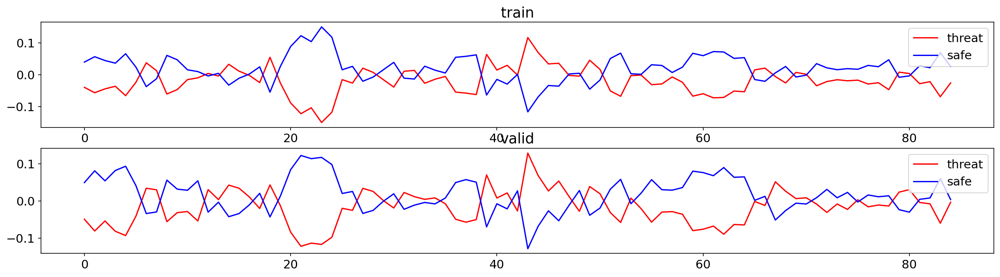

In [10]:
'''
data
'''
X_tr = torch.mean(X_train, dim=1)
y_tr = y_train[:, 0]

X_val = torch.mean(X_valid, dim=1)
y_val = y_valid[:, 0]

X_te = torch.mean(X_test, dim=1)
y_te = y_test[:, 0]


fig, axs = plt.subplots(
    2, 1, 
    figsize=(20, 5),
    dpi=150)
ax = axs[0]
ax.plot(torch.mean(X_tr[y_tr == args.LABELS[1], :], dim=0).cpu().numpy(), color='red', label=args.names[1])
ax.plot(torch.mean(X_tr[y_tr == args.LABELS[0], :], dim=0).cpu().numpy(), color='blue', label=args.names[0])
ax.legend()
ax.set_title(f"train")

ax = axs[1]
ax.plot(torch.mean(X_val[y_val == args.LABELS[1], :], dim=0).cpu().numpy(), color='red', label=args.names[1])
ax.plot(torch.mean(X_val[y_val == args.LABELS[0], :], dim=0).cpu().numpy(), color='blue', label=args.names[0])
ax.legend()
ax.set_title(f"valid")

### basic feed forward model: multilayer perceptron
logistic regression also.

Epoch: 01
	Train Loss: 0.693 | Train Acc: 51.17%
	 Val. Loss: 0.689 |  Val. Acc: 55.23%
Epoch: 02
	Train Loss: 0.686 | Train Acc: 57.41%
	 Val. Loss: 0.683 |  Val. Acc: 60.83%
Epoch: 03
	Train Loss: 0.680 | Train Acc: 63.08%
	 Val. Loss: 0.675 |  Val. Acc: 64.36%
Epoch: 04
	Train Loss: 0.671 | Train Acc: 66.46%
	 Val. Loss: 0.667 |  Val. Acc: 66.49%
Epoch: 05
	Train Loss: 0.663 | Train Acc: 67.16%
	 Val. Loss: 0.657 |  Val. Acc: 68.58%
Epoch: 06
	Train Loss: 0.655 | Train Acc: 67.54%
	 Val. Loss: 0.647 |  Val. Acc: 69.28%
Epoch: 07
	Train Loss: 0.647 | Train Acc: 68.21%
	 Val. Loss: 0.638 |  Val. Acc: 69.68%
Epoch: 08
	Train Loss: 0.635 | Train Acc: 69.40%
	 Val. Loss: 0.630 |  Val. Acc: 69.20%
Epoch: 09
	Train Loss: 0.627 | Train Acc: 69.70%
	 Val. Loss: 0.623 |  Val. Acc: 70.06%
Epoch: 10
	Train Loss: 0.620 | Train Acc: 70.28%
	 Val. Loss: 0.616 |  Val. Acc: 70.26%
Epoch: 11
	Train Loss: 0.613 | Train Acc: 70.73%
	 Val. Loss: 0.611 |  Val. Acc: 70.56%
Epoch: 12
	Train Loss: 0.614 | T

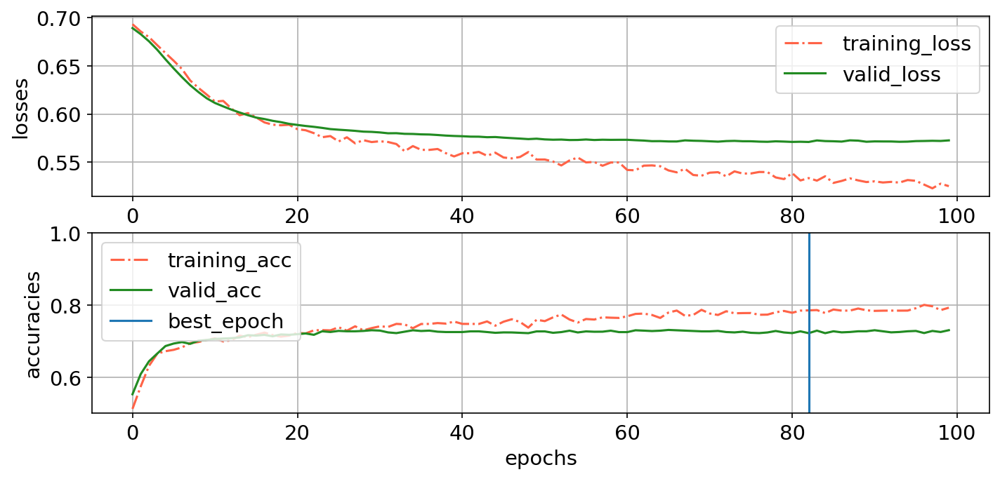

In [11]:
'''
model
'''
args.input_dim = X_tr.size()[1]
args.out_dim = len(args.LABELS)
args.hidden_dim = 32
args.num_epochs = 100
args.batch_size = 64
args.num_classes = len(args.LABELS)
args.dropout = 0.5

class FF_classifier(nn.Module):
    def __init__(self, args):
        super(FF_classifier, self).__init__()

        self.fc1 = nn.Linear(args.input_dim, args.hidden_dim,)

        self.fc2 = nn.Linear(args.hidden_dim, args.out_dim)

        self.dropout = nn.Dropout(args.dropout)
    
    def forward(self, x):
        batch_size = x.shape[0]
        x = x.view(batch_size, -1)

        h = F.relu(self.fc1(x))
        h = self.dropout(h)

        return torch.sigmoid(self.fc2(h))

    def accuracy(self, y_pred, y_true):
        labels_pred = torch.argmax(y_pred, axis=-1)
        mask = (y_true != args.MASK).bool()
        correct = 1-torch.abs(labels_pred[mask] - y_true[mask])
        return correct.sum() / len(correct)

model = FF_classifier(args)

criterion = nn.CrossEntropyLoss(ignore_index=args.MASK, reduction='mean')
optimizer = torch.optim.Adam(model.parameters())

model.to(device)
criterion.to(device)

permut_train = torch.randperm(X_tr.size()[0])
permut_valid = torch.randperm(X_val.size()[0])

data = (X_tr, y_tr, X_val, y_val)

model, best_model, history, best_epoch = fit(data, model, criterion, optimizer)
plot_training_history(history, best_epoch)

print(f"valid: {evaluate(best_model, X_val, y_val, criterion, permut_valid)}")

permut_test = torch.randperm(X_te.size()[0])
print(f"test: {evaluate(best_model, X_te, y_te, criterion, permut_test)}")

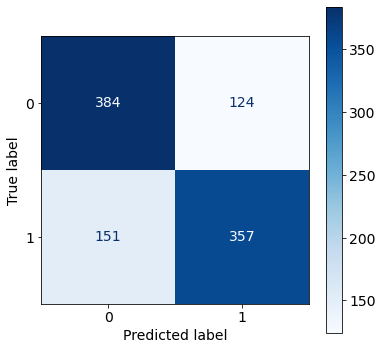

In [12]:
targets = y_val.cpu().numpy()
pred_labels = torch.argmax(model(X_val), dim=1).cpu().numpy()
plot_confusion_matrix(targets, pred_labels)

#### misclassified samples

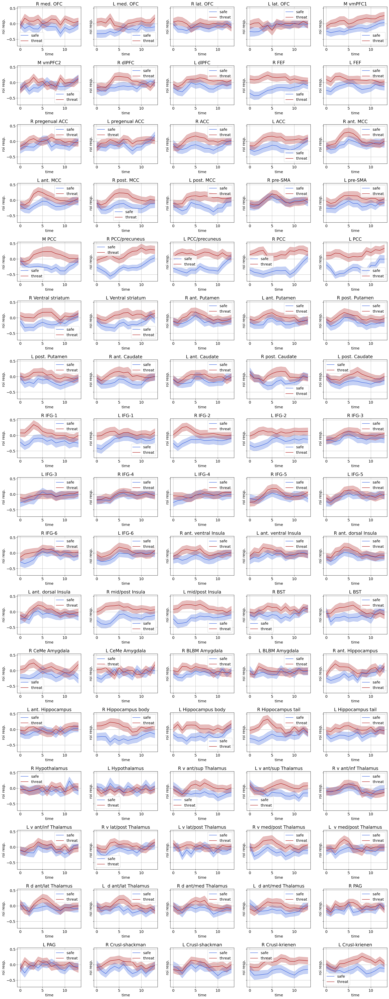

In [13]:
mis_idx = targets != pred_labels
y_mis = y_val[mis_idx][:, None].cpu().numpy()
X_mis = X_valid[mis_idx, :, :].cpu().numpy()
plot_roi_time_series(X_mis, y_mis, savefig=False)

Very surprisingly, the samples seem to belong to the other class!! 
`threat` appears **above** the `safe` samples. 

#### correctly classified samples

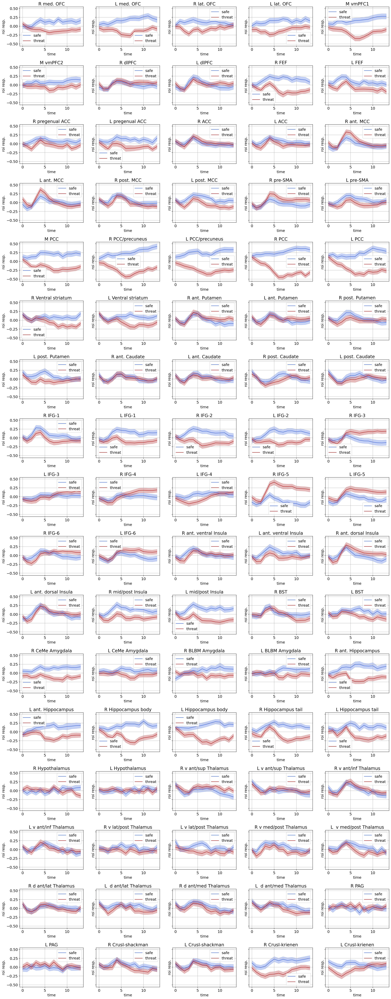

In [14]:
idx = targets == pred_labels
y = y_val[idx][:, None].cpu().numpy()
X = X_valid[idx, :, :].cpu().numpy()
plot_roi_time_series(X, y, savefig=False)

### temporal convolutional networks: tcn

In [15]:
'''
model
'''


'\nmodel\n'

### gated recurrent neural network: gru

/home/govindas/venvs/expln-ai3.9/lib/python3.9/site-packages/torch/nn/modules/rnn.py:62: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


Epoch: 01
	Train Loss: 0.688 | Train Acc: 55.63%
	 Val. Loss: 0.662 |  Val. Acc: 60.71%
Epoch: 02
	Train Loss: 0.665 | Train Acc: 59.51%
	 Val. Loss: 0.649 |  Val. Acc: 62.58%
Epoch: 03
	Train Loss: 0.649 | Train Acc: 61.38%
	 Val. Loss: 0.641 |  Val. Acc: 63.39%
Epoch: 04
	Train Loss: 0.639 | Train Acc: 62.81%
	 Val. Loss: 0.634 |  Val. Acc: 63.93%
Epoch: 05
	Train Loss: 0.625 | Train Acc: 64.42%
	 Val. Loss: 0.628 |  Val. Acc: 64.40%
Epoch: 06
	Train Loss: 0.612 | Train Acc: 65.19%
	 Val. Loss: 0.625 |  Val. Acc: 64.84%
Epoch: 07
	Train Loss: 0.601 | Train Acc: 66.26%
	 Val. Loss: 0.623 |  Val. Acc: 64.78%
Epoch: 08
	Train Loss: 0.588 | Train Acc: 67.40%
	 Val. Loss: 0.624 |  Val. Acc: 64.47%
Epoch: 09
	Train Loss: 0.580 | Train Acc: 68.09%
	 Val. Loss: 0.626 |  Val. Acc: 64.44%
Epoch: 10
	Train Loss: 0.570 | Train Acc: 68.74%
	 Val. Loss: 0.627 |  Val. Acc: 64.48%
Epoch: 11
	Train Loss: 0.558 | Train Acc: 69.93%
	 Val. Loss: 0.632 |  Val. Acc: 64.53%
Epoch: 12
	Train Loss: 0.547 | T

/home/govindas/venvs/expln-ai3.9/lib/python3.9/site-packages/torch/nn/modules/rnn.py:942: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at  ../aten/src/ATen/native/cudnn/RNN.cpp:926.)
  result = _VF.gru(input, hx, self._flat_weights, self.bias, self.num_layers,


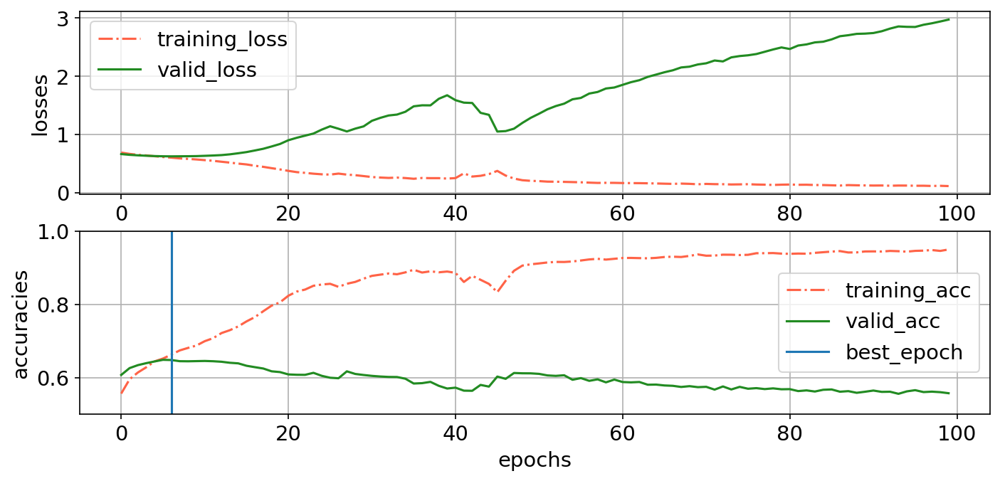

In [16]:
'''
model
'''
args.input_dim = X_train.size()[-1]
args.out_dim = len(args.LABELS)
args.hidden_dim = 32
args.num_epochs = 100
args.batch_size = 64
# args.num_classes = len(args.LABELS)
args.dropout = 0.5

class GRU_classifier(nn.Module):
    def __init__(self, args):
        super(GRU_classifier, self).__init__()

        self.gru = nn.GRU(
            input_size=args.input_dim,
            hidden_size=args.hidden_dim,
            num_layers=1,
            batch_first=True,
            dropout=args.dropout
        )
        
        self.fc = nn.Linear(args.hidden_dim, args.out_dim)

        self.dropout = nn.Dropout(args.dropout)

    def forward(self, x):
        x, hn = self.gru(x)
        x = self.dropout(x)
        y = self.fc(x)
        return y

    # def initHidden(self, args):
        # return torch.zeros(1, args.batch_size, args.num_units, device=device)

    def accuracy(self, y_pred, y_true):
        labels_pred = torch.argmax(y_pred, axis=-1)
        mask = (y_true != args.MASK).bool()
        correct = 1-torch.abs(labels_pred[mask] - y_true[mask])
        return correct.sum() / len(correct)

model = GRU_classifier(args)

criterion = nn.CrossEntropyLoss(ignore_index=args.MASK, reduction='mean')
optimizer = torch.optim.Adam(model.parameters())

model.to(device)
criterion.to(device)

permut_train = torch.randperm(X_train.size()[0])
permut_valid = torch.randperm(X_valid.size()[0])

data = (X_train, y_train, X_valid, y_valid)

model, best_model, history, best_epoch = fit(data, model, criterion, optimizer)
plot_training_history(history, best_epoch)

print(f"valid: {evaluate(best_model, X_valid, y_valid, criterion, permut_valid)}")

permut_test = torch.randperm(X_test.size()[0])
print(f"test: {evaluate(best_model, X_test, y_test, criterion, permut_test)}")

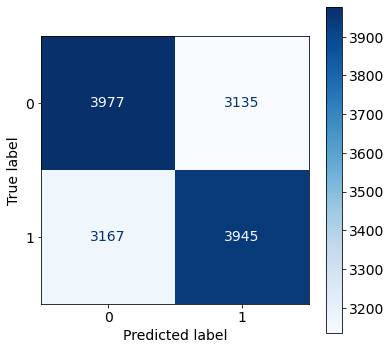

In [17]:
targets = y_valid.cpu().numpy()
pred_labels = torch.argmax(model(X_valid), dim=-1).cpu().numpy()
plot_confusion_matrix(targets.ravel(), pred_labels.ravel())

#### misclassified samples

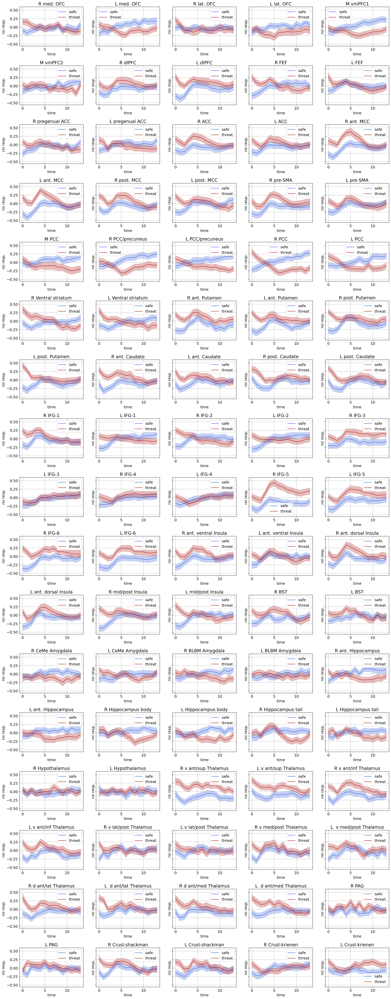

In [18]:
mis_mask = (targets != pred_labels)[:, 0]
mis_mask
y_mis = y_valid[mis_mask, :].cpu().numpy()
X_mis = X_valid[mis_mask, :, :].cpu().numpy()
plot_roi_time_series(X_mis, y_mis, savefig=False)
# print(X_mis.shape, y_mis.shape)

In [21]:
torch.cuda.BoolTensor(mis_mask, device=device)

tensor([False, False,  True,  ..., False, False, False], device='cuda:1')

Very surprisingly, the samples seem to belong to the other class!! 
`threat` appears **above** the `safe` samples. 

#### correctly classified samples

In [20]:
idx = targets == pred_labels
y = y_val[idx][:, None].cpu().numpy()
X = X_valid[idx, :, :].cpu().numpy()
plot_roi_time_series(X, y, savefig=False)

IndexError: Dimension out of range (expected to be in range of [-1, 0], but got 1)